In [242]:
import os
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Data Visualization

In [243]:
PALLETE = [
        [0, 0, 0],
        [0, 0, 255],
        ]

In [244]:
def normalize(band):
    band_min, band_max = (band.min(), band.max())
    return ((band - band_min) / ((band_max - band_min)))

In [245]:
def brighten(band):
    alpha = 0.13
    beta = 0
    return np.clip(alpha * band + beta, 0, 255)

In [246]:
def convert(im_path):
    with rasterio.open(im_path) as fin:
        red = fin.read(3)
        green = fin.read(2)
        blue = fin.read(1)

    red_b = brighten(red)
    blue_b = brighten(blue)
    green_b = brighten(green)

    red_bn = normalize(red_b)
    green_bn = normalize(green_b)
    blue_bn = normalize(blue_b)

    return np.dstack((blue_b, green_b, red_b)), np.dstack((red_bn, green_bn, blue_bn))

In [247]:
def plot_data(image_path, mask_path):
    plt.figure(figsize=(12, 12))
    pal = [value for color in PALLETE for value in color]

    plt.subplot(1, 2, 1)
    _, img = convert(image_path)
    plt.imshow(img)

    plt.subplot(1, 2, 2)
    with rasterio.open(mask_path) as fin:
        mask = fin.read(1)
    mask = Image.fromarray(mask).convert('P')
    mask.putpalette(pal)
    plt.imshow(mask)
    plt.show();

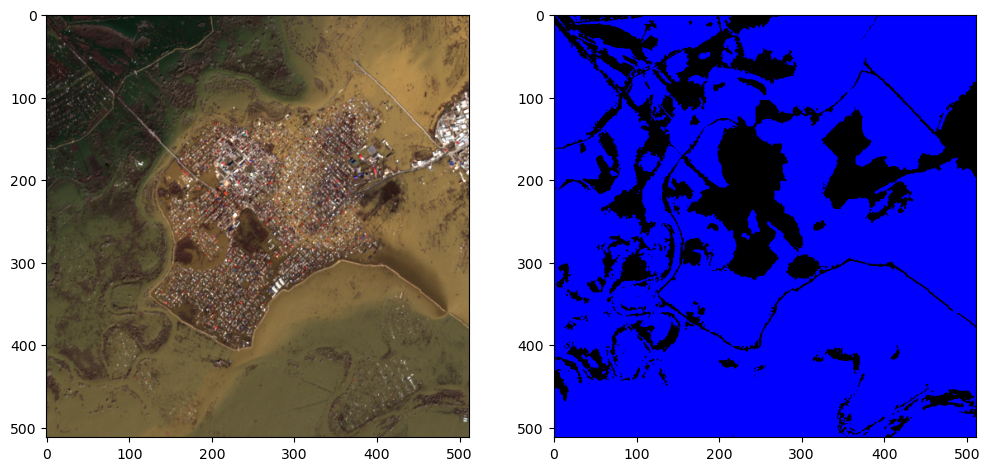

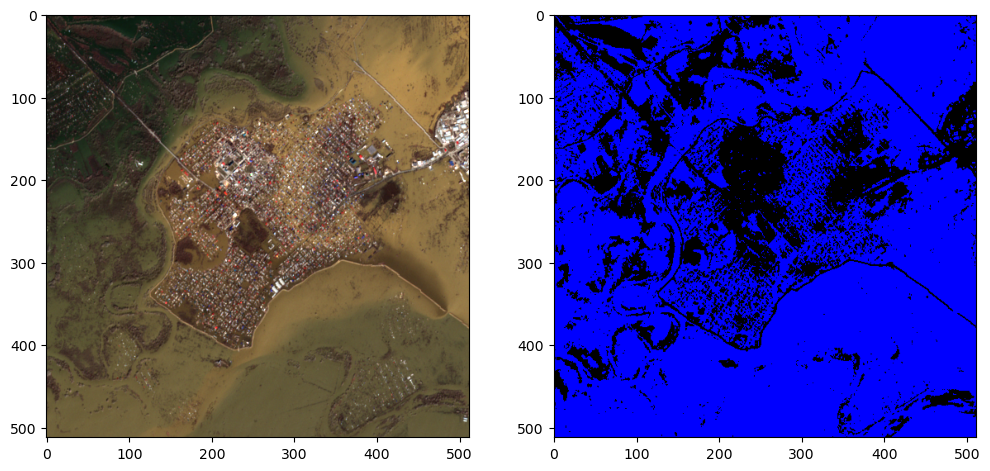

In [248]:
plot_data('train/images/9_2.tif', 'train/masks/9_2.tif')
plot_data('train/images/9_2.tif', 'train/example_preds/9_2.tif')

# Divide big image into tile dataset

In [249]:
from tqdm import tqdm
from typing import List, Optional
from rasterio.windows import Window

In [452]:
def get_tiles_with_overlap(image_width: int, image_height: int, 
                           tile_size: int, overlap: int) -> List[Window]:
    """
    Calculate the windows for tiles with specified overlap across the image.

    Parameters:
        image_width (int): The width of the input image in pixels.
        image_height (int): The height of the input image in pixels.
        tile_size (int): The size of each tile (assumes square tiles).
        overlap (int): The number of overlapping pixels between adjacent tiles.

    Returns:
        List[Window]: A list of rasterio Window objects representing each tile.
    """
    step_size = tile_size - overlap
    tiles = []
    print(step_size)
    for y in range(0, image_height, step_size):
        for x in range(0, image_width, step_size):
            window = Window(x, y, tile_size, tile_size)
            print(window)
            # Adjust window if it exceeds the image bounds
            window = window.intersection(Window(0, 0, image_width, image_height))
            tiles.append(window)
    return tiles

In [453]:
def save_tile(src_dataset: rasterio.io.DatasetReader, window: Window, 
              output_folder: str, tile_index: int, image_id: int) -> None:
    """
    Extract and save a single tile from the source dataset.

    Parameters:
        src_dataset (rasterio.io.DatasetReader): The opened rasterio dataset (the input image).
        window (Window): The window (rasterio Window object) defining the tile.
        output_folder (str): The folder where the tiles will be saved.
        tile_index (int): Index of the tile to be used for naming the file.
        image_id (int): Image id to be used for naming the file.

    Returns:
        None
    """
    transform = src_dataset.window_transform(window)
    tile_data = src_dataset.read(window=window)
    
    profile = src_dataset.profile
    profile.update({
        'driver': 'GTiff',
        'height': window.height,
        'width': window.width,
        'transform': transform
    })
    
    output_filename = os.path.join(output_folder, f"tile_{image_id}_{tile_index}.tif")
    with rasterio.open(output_filename, 'w', **profile) as dst:
        dst.write(tile_data)

In [460]:
def split_image(image_path: str, output_folder: str, mask_path: Optional[str] = None, 
                tile_size: int = 512, overlap: int = 128, image_id: int = 0) -> None:
    """
    Split a large GeoTIFF image and its corresponding mask (if provided) into tiles with overlap 
    and save them.

    Parameters:
        image_path (str): The file path of the input TIFF image.
        mask_path (Optional[str]): The file path of the corresponding mask TIFF image. If None, only image is processed.
        output_folder (str): The folder where the tiles will be saved.
        tile_size (int, optional): The size of the tiles. Default is 512x512.
        overlap (int, optional): The number of pixels to overlap between tiles. Default is 128 pixels.
        image_id (int, optional): ID of the input image to be used for naming the file. 
            Defaults to 0.

    Returns:
        None
    """
    with rasterio.open(image_path) as src_image:
        image_width = src_image.width
        image_height = src_image.height

        # Create output directories for images and masks (if available)
        images_folder = os.path.join(output_folder, 'images')
        os.makedirs(images_folder, exist_ok=True)

        if mask_path:
            masks_folder = os.path.join(output_folder, 'masks')
            os.makedirs(masks_folder, exist_ok=True)

        # Get list of tiles with overlap
        tiles = get_tiles_with_overlap(image_width, image_height, tile_size, overlap)
        print(tiles)

        # Save image tiles (and mask tiles if provided)
        if mask_path:
            with rasterio.open(mask_path) as src_mask:
                for idx, window in tqdm(enumerate(tiles)):
                    save_tile(src_image, window, images_folder, idx, image_id)
                    save_tile(src_mask, window, masks_folder, idx, image_id)
        else:
            for idx, window in tqdm(enumerate(tiles)):
                save_tile(src_image, window, images_folder, idx, image_id)

In [479]:
output_folder = 'data_9_2/' 
image_path = 'train/images/9_2.tif' 
mask_path = 'train/masks/9_2.tif'


split_image(
    image_path=image_path, mask_path=mask_path,
    output_folder=output_folder, tile_size=256,
    overlap=32, image_id=2
    ) 

224
Window(col_off=0, row_off=0, width=256, height=256)
Window(col_off=224, row_off=0, width=256, height=256)
Window(col_off=448, row_off=0, width=256, height=256)
Window(col_off=0, row_off=224, width=256, height=256)
Window(col_off=224, row_off=224, width=256, height=256)
Window(col_off=448, row_off=224, width=256, height=256)
Window(col_off=0, row_off=448, width=256, height=256)
Window(col_off=224, row_off=448, width=256, height=256)
Window(col_off=448, row_off=448, width=256, height=256)
[Window(col_off=0, row_off=0, width=256, height=256), Window(col_off=224, row_off=0, width=256, height=256), Window(col_off=448, row_off=0, width=64, height=256), Window(col_off=0, row_off=224, width=256, height=256), Window(col_off=224, row_off=224, width=256, height=256), Window(col_off=448, row_off=224, width=64, height=256), Window(col_off=0, row_off=448, width=256, height=64), Window(col_off=224, row_off=448, width=256, height=64), Window(col_off=448, row_off=448, width=64, height=64)]


9it [00:00, 25.92it/s]


# Reading Data and creating Dataloader example in Pytorch

In [254]:
def image_padding(image, target_size=256):
    """
    Pad an image to a target size using reflection padding.
    """
    height, width = image.shape[1:3]
    pad_height = max(0, target_size - height)
    pad_width = max(0, target_size - width)
    padded_image = np.pad(image, ((0, 0), (0, pad_height),
                                  (0, pad_width)), mode='reflect')
    return padded_image


def mask_padding(mask, target_size=256):
    """
    Pad a mask to a target size using reflection padding.
    """
    height, width = mask.shape
    pad_height = max(0, target_size - height)
    pad_width = max(0, target_size - width)
    padded_mask = np.pad(mask, ((0, pad_height), (0, pad_width)),
                         mode='reflect')
    return padded_mask

In [451]:
def get_data_list(img_path):
    """
    Retrieves a list of file names from the given directory.
    """
    name = []
    for _, _, filenames in os.walk(img_path): # given a directory iterates over the files
        for filename in filenames:
            f = filename.split('.')[0]
            name.append(f)
    df =  pd.DataFrame({'id': name}, index = np.arange(0, len(name))
                       ).sort_values('id').reset_index(drop=True)
    df = df['id'].values

    #return np.delete(df, 0)
    return df

In [256]:
class WaterDataset(Dataset):
    def __init__(self, img_path, mask_path, file_names):
        self.img_path = img_path
        self.mask_path = mask_path
        self.file_names = file_names

    def __len__(self):
            return len(self.file_names)

    def __getitem__(self, idx):
        with rasterio.open(self.img_path + self.file_names[idx] + '.tif') as fin:
            image = fin.read()
        image = image_padding(image).astype(np.float32)

        with rasterio.open(self.mask_path + self.file_names[idx] + '.tif') as fin:
            mask = fin.read(1)
        mask = mask_padding(mask)

        return image, mask

**Here we have one Sentinel-2A image with 10 channels:**


| Name | Description                                          | Resolution |
|------|------------------------------------------------------|------------|
| B02  | Blue, 492.4 nm (S2A), 492.1 nm (S2B)                 | 10m        |
| B03  | Green, 559.8 nm (S2A), 559.0 nm (S2B)                | 10m        |
| B04  | Red, 664.6 nm (S2A), 665.0 nm (S2B)                  | 10m        |
| B05  | Vegetation red edge, 704.1 nm (S2A), 703.8 nm (S2B)  | 20m        |
| B06  | Vegetation red edge, 740.5 nm (S2A), 739.1 nm (S2B)  | 20m        |
| B07  | Vegetation red edge, 782.8 nm (S2A), 779.7 nm (S2B)  | 20m        |
| B08  | NIR, 832.8 nm (S2A), 833.0 nm (S2B)                  | 10m        | 
| B8A  | Narrow NIR, 864.7 nm (S2A), 864.0 nm (S2B)           | 20m        |
| B11  | SWIR, 1613.7 nm (S2A), 1610.4 nm (S2B)               | 20m        |
| B12  | SWIR, 2202.4 nm (S2A), 2185.7 nm (S2B)               | 20m        |

**And mask with values from 0 to 1:**

0. backgound
1. water

# Inference

In [262]:
# In inference you should have pipline read big image devide it into tiles and inference and then concat result into big mask and save to geoTiff

In [263]:
'''# Here is example of how to save result to geoTiff
with rasterio.open('path_to_image') as multi_band_src:
    image = multi_band_src.read()
    meta = multi_band_src.meta

# Split image to tile, inference and concat 
predict = None # model.predict(image)

meta['count'] = 1

with rasterio.open('path_to_output_geoTiff', 'w', **meta) as fout:
    fout.write(predict, 1)'''

"# Here is example of how to save result to geoTiff\nwith rasterio.open('path_to_image') as multi_band_src:\n    image = multi_band_src.read()\n    meta = multi_band_src.meta\n\n# Split image to tile, inference and concat \npredict = None # model.predict(image)\n\nmeta['count'] = 1\n\nwith rasterio.open('path_to_output_geoTiff', 'w', **meta) as fout:\n    fout.write(predict, 1)"

### !!! Remark: If you see the image with the same id but {_01} and {_02}, it means that first one is image before flood and the second one after

### Моя дрянь

In [264]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import matplotlib.pyplot as plt



In [265]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        self.encoder1 = self.conv_block(in_channels, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)
        
        self.bottleneck = self.conv_block(512, 1024)
        
        self.decoder4 = self.conv_block(1024 + 512, 512)
        self.decoder3 = self.conv_block(512 + 256, 256)
        self.decoder2 = self.conv_block(256 + 128, 128)
        self.decoder1 = self.conv_block(128 + 64, 64)
        
        self.output_layer = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder path
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(F.max_pool2d(enc1, kernel_size=2))
        enc3 = self.encoder3(F.max_pool2d(enc2, kernel_size=2))
        enc4 = self.encoder4(F.max_pool2d(enc3, kernel_size=2))
        
        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, kernel_size=2))
        
        # Decoder path
        dec4 = self.decoder4(torch.cat([F.interpolate(bottleneck, scale_factor=2), enc4], dim=1))
        dec3 = self.decoder3(torch.cat([F.interpolate(dec4, scale_factor=2), enc3], dim=1))
        dec2 = self.decoder2(torch.cat([F.interpolate(dec3, scale_factor=2), enc2], dim=1))
        dec1 = self.decoder1(torch.cat([F.interpolate(dec2, scale_factor=2), enc1], dim=1))
        
        return torch.sigmoid(self.output_layer(dec1))

In [266]:
model = UNet(in_channels=5, out_channels=1)

#dummy_input = torch.randn(1, 10, 256, 256)  # Пример 10-канального изображения размером 256x256
#output = model(dummy_input)
#print(output.shape)

In [480]:
path = "data_9_2"

In [481]:
data_list = get_data_list(f'{path}/images/')
ds = WaterDataset(
    img_path=f'{path}/images/',
    mask_path=f'{path}/masks/',
    file_names=data_list
)
dl = DataLoader(ds, batch_size=8)
data_list

array(['tile_2_0', 'tile_2_1', 'tile_2_2', 'tile_2_3', 'tile_2_4',
       'tile_2_5', 'tile_2_6', 'tile_2_7', 'tile_2_8'], dtype=object)

In [268]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

criterion = nn.BCELoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [305]:
def get_new_channels(old_channels):
    
    old_channels = old_channels + 1
    # Индексы каналов (предполагаем, что известны)
    NIR_idx = 6  # Индекс канала ближнего инфракрасного излучения (NIR)
    SWIR1_idx = 8  # Индекс канала коротковолнового инфракрасного излучения 1 (SWIR1)
    SWIR2_idx = 9  # Индекс канала коротковолнового инфракрасного излучения 2 (SWIR2)
    GREEN_idx = 1  # Индекс зеленого канала
    RED_idx = 2  # Индекс красного канала

    # Извлекаем соответствующие каналы
    NIR = old_channels[:, NIR_idx, :, :]
    SWIR1 = old_channels[:, SWIR1_idx, :, :]
    SWIR2 = old_channels[:, SWIR2_idx, :, :]
    GREEN = old_channels[:, GREEN_idx, :, :]
    RED = old_channels[:, RED_idx, :, :]

    # Вычисляем новые каналы по формулам и нормализуем их
    NDWI = (((NIR - SWIR2) / (NIR + SWIR2))+1) / 2

    WRI = (GREEN + RED) / (NIR + SWIR2) 
    WRI_mask_4 = WRI > 4
    WRI[WRI_mask_4] = 4
    WRI = WRI/4

    MNDWI = (((GREEN - SWIR2) / (GREEN + SWIR2))+1) / 2
    NDSI = (((GREEN - SWIR1) / (GREEN + SWIR1))+1) / 2
    NDTI = ((((RED- GREEN)/(RED+GREEN)))+1) / 2

    # Собираем новое изображение из новых каналов
    new_inputs = torch.stack([NDWI, WRI, MNDWI, NDSI, NDTI], dim=1)
    return new_inputs

Эпоха 100/100: 100%|██████████| 138/138 [00:35<00:00,  3.91it/s, Потери=0.552]


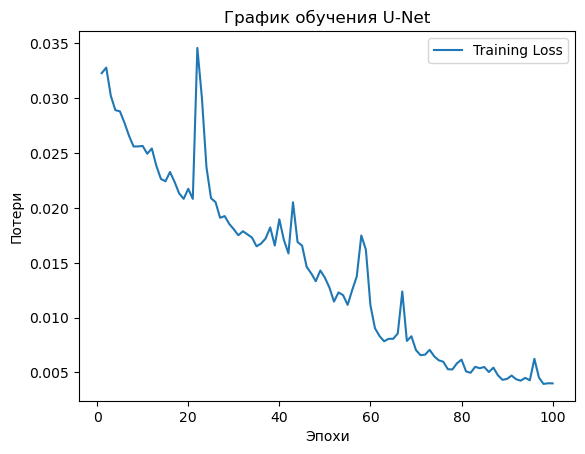

In [353]:
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
train_losses = []
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    # Прогресс-бар для каждой эпохи
    with tqdm(total=len(dl), desc=f"Эпоха {epoch+1}/{num_epochs}") as pbar:
        for batch_idx, (inputs, targets) in enumerate(dl):

            new_inputs = get_new_channels(inputs)
            new_inputs = new_inputs.float()

            if targets.dim() == 3:  # Проверка, если target размером [1, 256, 256]
                targets = targets.unsqueeze(1)  # Преобразование в [1, 1, 256, 256]
        
            targets = targets.float()
            
            # Прямой и обратный проходы
            output = model(new_inputs.to(device))
            loss = criterion(output.to("cpu"), targets)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
            running_loss += loss.item()
            # Обновление прогресс-бара и отображение потерь
            pbar.set_postfix({'Потери': running_loss})
            pbar.update(1)
    epoch_loss = running_loss / len(dl)
    #print(f"Потери на эпохе {epoch+1}: {epoch_loss}")
    train_losses.append(epoch_loss)

plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss")
plt.xlabel("Эпохи")
plt.ylabel("Потери")
plt.title("График обучения U-Net")
plt.legend()
plt.show()


IndexError: index 1 is out of bounds for dimension 0 with size 1

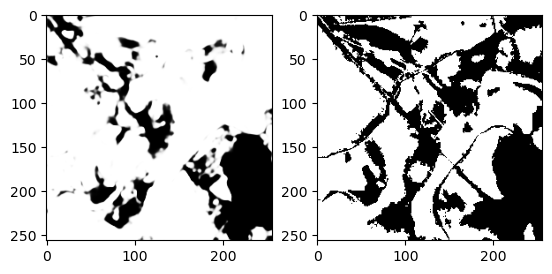

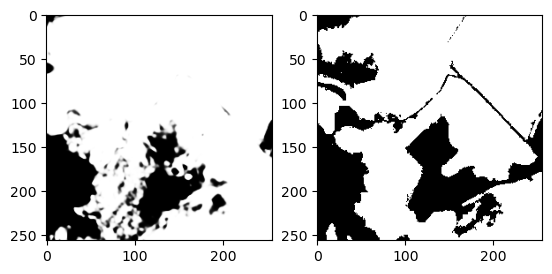

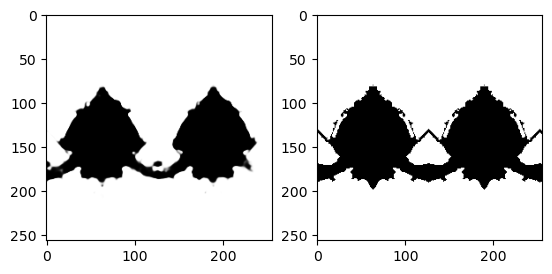

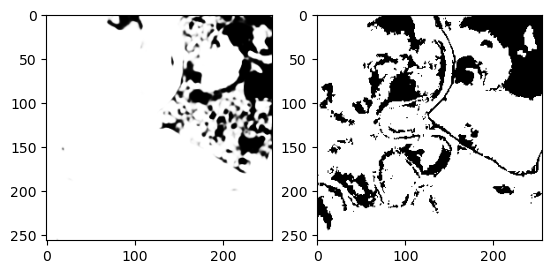

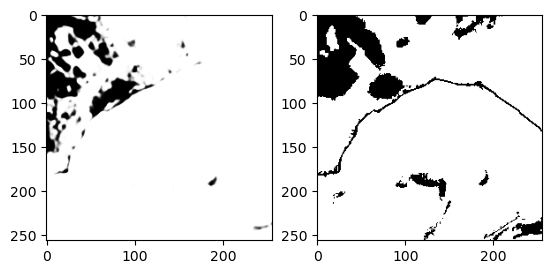

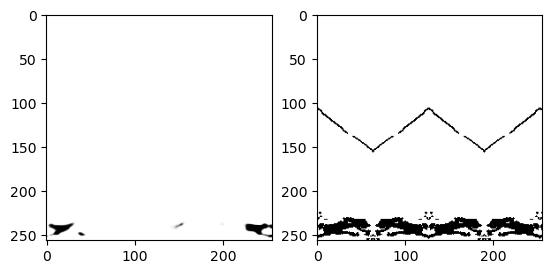

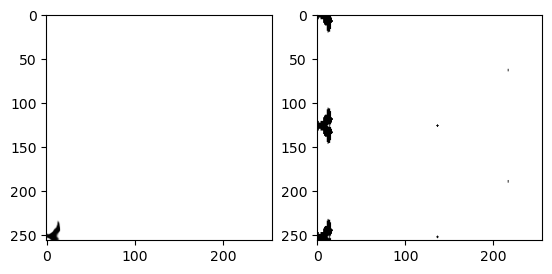

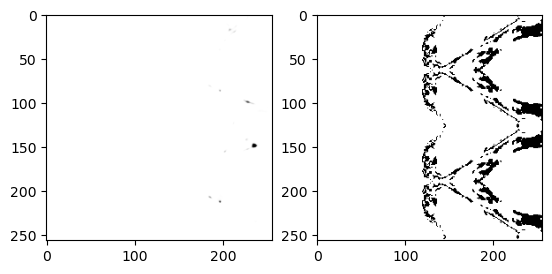

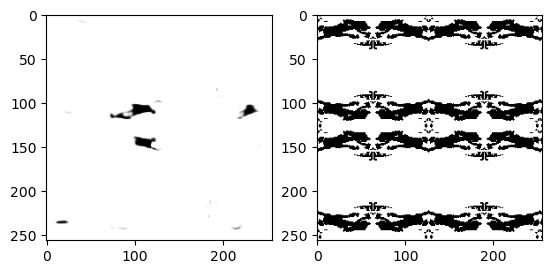

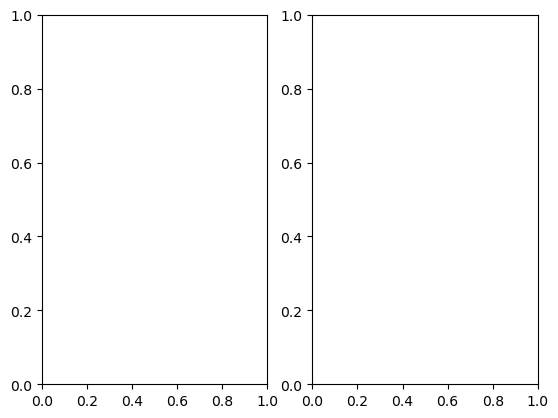

In [482]:
with torch.no_grad():
    model.eval()
    model = model.to(device)
    outs = []
    #i = 0
    for inp, target in dl: 
        new_inp = get_new_channels(inp)
        out = model(new_inp.to(device))
        out = out.cpu()
        outs.append(out)

        #if target.sum() > 0:
        for i in range(8):
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(out[i, 0], cmap='gray')  # Отображение предсказания
            ax[1].imshow(target[i], cmap='gray')  # Отображение истинной маски
            #i += 1
            #if i == 20: break

In [513]:
def merge_tiles(tiles, tile_size, overlap):
    num_tiles = len(tiles)
    new_img = np.zeros((tile_size + (tile_size - overlap)*num_tiles, tile_size + (tile_size - overlap)*num_tiles))
    print(new_img.shape)
    j = 0
    for i in range(num_tiles):
        new_img[i*(tile_size - overlap):i*(tile_size - overlap) + tile_size, i*(tile_size - overlap):i*(tile_size - overlap) + tile_size] = tiles[i][0, 0, :, :]
        if (i*(tile_size - overlap) + tile_size) == new_img.shape[0]:
            j += 1
        return new_img


(704, 704)


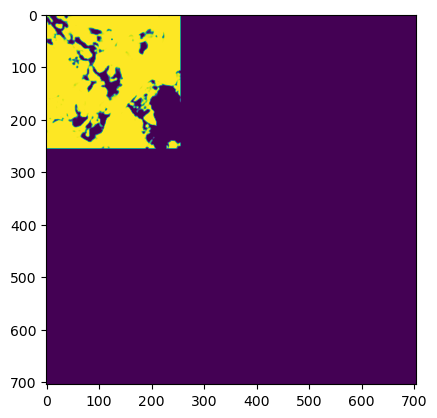

In [515]:
im = merge_tiles(outs, 256, 32)
plt.imshow(im)

In [496]:
def open_tif(file_path):
    with rasterio.open(file_path) as src:
        data = src.read(1)  # Read the first band
    return data

C:\Users\TitanPC\AppData\Local\Temp\ipykernel_18500\2213233359.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2)


IndexError: list index out of range

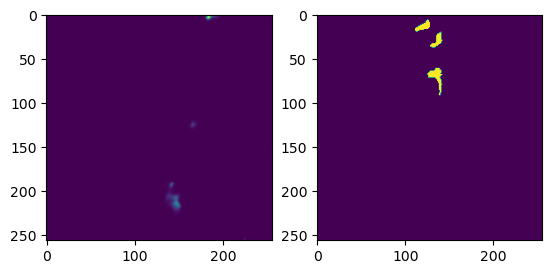

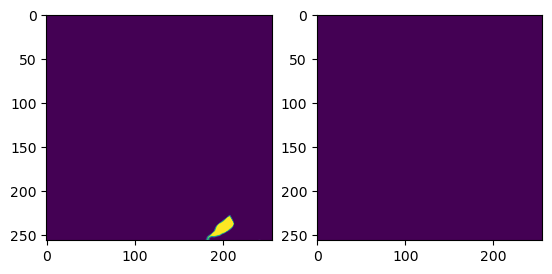

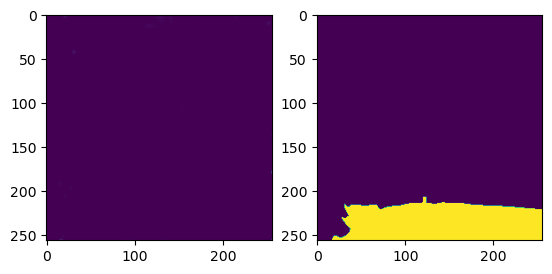

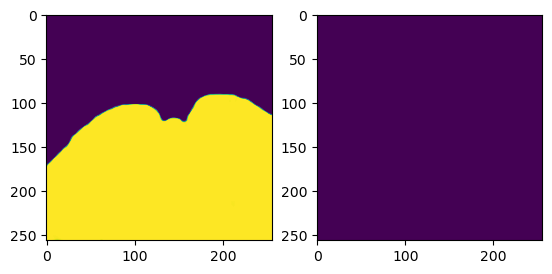

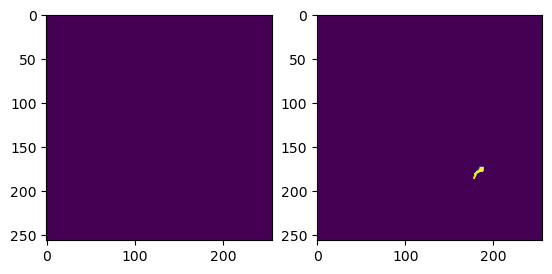

...

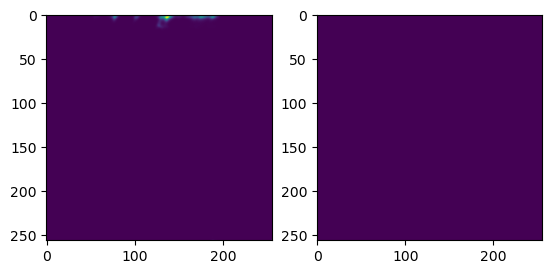

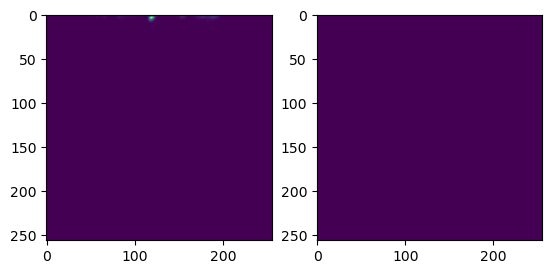

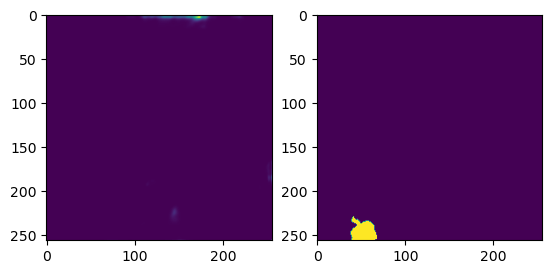

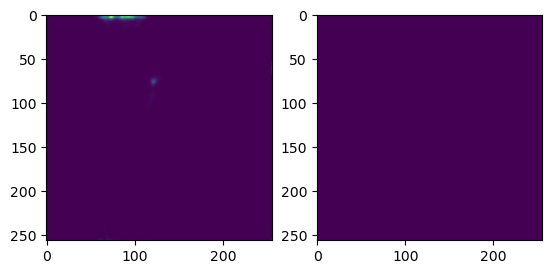

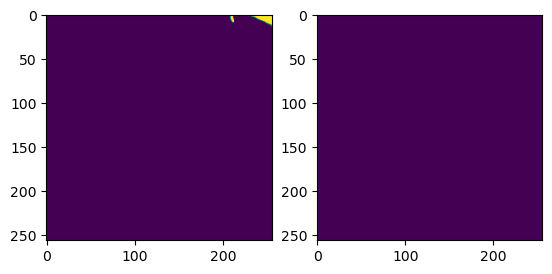

In [397]:
preds = os.listdir("preds")
truths = os.listdir("data_6_2/masks")
for i in range(11, len(preds), 1):
    pred_name = preds[i]
    true_name = truths[i+1]

    img_pred = open_tif(f"preds/{pred_name}")
    img_true = open_tif(f"data_6_2/masks/{true_name}")
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(img_pred)
    ax[1].imshow(img_true)
    if i% 10: break

In [486]:
len(outs[1])

1

In [492]:
import torch
import rasterio
import numpy as np

# Создаем одноканальный тензор размером 256x256
#tensor = torch.randn(1, 256, 256)
i=0
for tensor in outs:
    print(tensor.shape)
    if tensor.shape[0] != 1:
        image_np = tensor.squeeze().numpy()
    else:
        image_np = tensor.numpy()[0]
    print(image_np.shape)
    for img in image_np:
        # Создаем профиль для сохранения изображения
        profile = {
            'driver': 'GTiff',
            'height': img.shape[0],
            'width': img.shape[1],
            'count': 1,
            'dtype': img.dtype
        }
        
        # Сохраняем изображение в файл .tif
        output_filename = f'preds_test/{i}.tif'
        with rasterio.open(output_filename, 'w', **profile) as dst:
            dst.write(img, 1)
        i += 1


torch.Size([8, 1, 256, 256])
(8, 256, 256)
torch.Size([1, 1, 256, 256])
(1, 256, 256)


d:\VSC\YanCup\.conda\Lib\site-packages\rasterio\__init__.py:378: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(


In [516]:
#torch.save(model, "UNet_100_6_2.pt")
torch.save(model.state_dict(), "unet_100_6_2.pth")

In [517]:
new_model = UNet(5, 1)
new_model.load_state_dict(torch.load("unet_100_6_2.pth"))

C:\Users\TitanPC\AppData\Local\Temp\ipykernel_18500\3802063759.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  new_model.load_state_dict(torch.load("unet_100_6_2.pth"))


<All keys matched successfully>

In [355]:
def load_raster(file_path):
    """Load a raster image and flatten it into a 1D array."""
    with rasterio.open(file_path) as src:
        data = src.read(1)  # Read the first band
    return data.flatten()


def calculate_f1_score(dir1, dir2):
    """Calculate the F1 score between corresponding images in two directories."""
    f1_scores = []
    
    # List all files in the directories
    files1 = sorted(os.listdir(dir1))
    files2 = sorted(os.listdir(dir2))
    
    
    for file1, file2 in zip(files1, files2):

        file_path1 = os.path.join(dir1, file1)
        file_path2 = os.path.join(dir2, file2)
        
        # Load the images
        img1 = load_raster(file_path1)
        img2 = load_raster(file_path2)
        
        # Calculate F1 score
        f1 = f1_score(img1, img2, average='macro')
        f1_scores.append(f1)
    
    # Calculate average F1 score across all image pairs
    average_f1 = np.mean(f1_scores)
    return average_f1

